# Мартьянова Александра Евгеньевна, курс «Data Science», ВКР

### Кластеризация параметров

#### 1. Загрузка и подготовка датасета

In [1]:
# Загрузка разных библиотек
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
from sklearn.metrics import silhouette_score
from fcmeans import FCM
import scipy.stats as stats
import statistics
from scipy.stats import f_oneway

%matplotlib inline 

In [2]:
# Загрузка в объект DataFrame файла X_bp.xlsx, метод read_excel
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [3]:
# Загрузка в объект DataFrame файла X_nup.xlsx, метод read_excel
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


In [4]:
# соединение объектов DataFrame, метод merge, объединение по индексу, тип объединения INNER
df = x_bp.merge(x_nup, how = 'inner', left_index = True, right_index = True)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [5]:
# Изменение типа данных индекса, метод astype('int')
df.index = df.index.astype('int')
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [6]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('float64')

In [7]:
# Изменение типа данных и ранжировка переменной 'Угол нашивки, град', метод astype('int')
df = df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

In [8]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('int32')

In [9]:
# Описательная статистика датасета df, метод describe()
df.describe(include='all')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


In [10]:
# Вывод сведений о новом объекте DataFrame df_s, метод info()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int32  
 11  Шаг нашивки      

In [11]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [12]:
# Заменить названия столбцов таблицы методом set_axis()
df = df.set_axis(['МатрНап','Плотн','МодУпр','КолвОтвер','КолвЭпокс','ТемпВсп','ПовПлотн','МодУпрРаст','ПрочнРаст','КолвСмол','УголНаш','ШагНаш','ПлотнНаш'], axis = 'columns') 
df.head()

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [13]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [14]:
df_s = df.copy()

#### 2. Нормализация датасета

In [15]:
# Загрузка MinMaxScaler из библиотеки sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

In [16]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)

In [17]:
# Описательная статистика нормализованного датасета df
df.describe()

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,0.488427,0.512533,0.386301,0.512273,0.426215,0.593354,0.344638,0.497880,0.508634,0.484838,0.491691,0.477768,0.549616
std,0.175541,0.154890,0.172978,0.156147,0.128370,0.130695,0.201092,0.167435,0.172724,0.156875,0.500175,0.177519,0.118772
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370696,0.404175,0.260652,0.412240,0.338919,0.507756,0.190296,0.386030,0.390881,0.382955,0.000000,0.351790,0.478890
50%,0.483912,0.516497,0.386165,0.512240,0.425487,0.593401,0.322574,0.494672,0.506003,0.486875,0.000000,0.478940,0.551423
75%,0.608045,0.608413,0.502528,0.618003,0.517842,0.679924,0.495105,0.606751,0.615432,0.587411,1.000000,0.594597,0.624537
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Прочность при растяжении, МПа

###### 4. Исключить из параметров 'МатрНап', 'Плотн', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш'

In [18]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [19]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


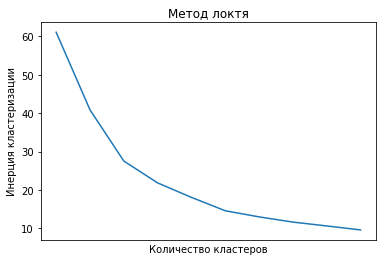

In [20]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [21]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

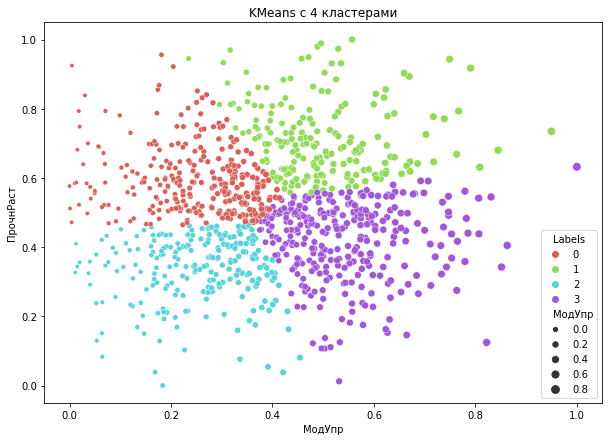

In [22]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=4).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['МодУпр'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['МодУпр'], palette=sns.color_palette('hls', 4))

plt.title('KMeans c 4 кластерами')
plt.show()

In [23]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

(МодУпр       284
 ПрочнРаст    284
 Labels       284
 dtype: int64,
 МодУпр       208
 ПрочнРаст    208
 Labels       208
 dtype: int64,
 МодУпр       224
 ПрочнРаст    224
 Labels       224
 dtype: int64,
 МодУпр       307
 ПрочнРаст    307
 Labels       307
 dtype: int64)

In [24]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20)

(13    0.504591
 15    0.698235
 16    0.698235
 21    0.504591
 22    0.504591
 25    0.564512
 27    0.719231
 29    0.593114
 32    0.507099
 40    0.644347
 52    0.497733
 55    0.585983
 57    0.753826
 58    0.598115
 61    0.522293
 64    0.699905
 67    0.683267
 71    0.639752
 75    0.627875
 91    0.546588
 Name: ПрочнРаст, dtype: float64,
 0     0.698235
 1     0.698235
 2     0.698235
 3     0.698235
 4     0.698235
 5     0.698235
 6     0.698235
 24    0.949223
 31    0.625957
 34    0.729017
 35    0.765150
 38    0.605842
 41    0.651495
 46    0.843247
 56    0.594412
 62    0.648537
 68    0.832440
 73    0.745932
 76    0.611853
 81    0.641660
 Name: ПрочнРаст, dtype: float64,
 7     0.271429
 17    0.271429
 18    0.271429
 20    0.342563
 28    0.445341
 36    0.303619
 42    0.421020
 44    0.436028
 45    0.214490
 50    0.348433
 51    0.377301
 54    0.456669
 60    0.394141
 65    0.209087
 66    0.428445
 69    0.401032
 77    0.129287
 78    0.460457
 79 

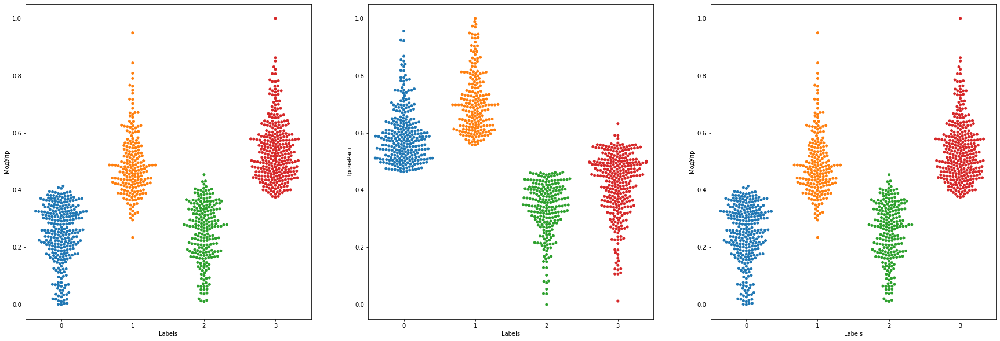

In [25]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='МодУпр', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='МодУпр', data=X, ax=ax)

plt.show()

In [26]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.3191382318236067


###### Иерархическая кластеризация (агломеративная)

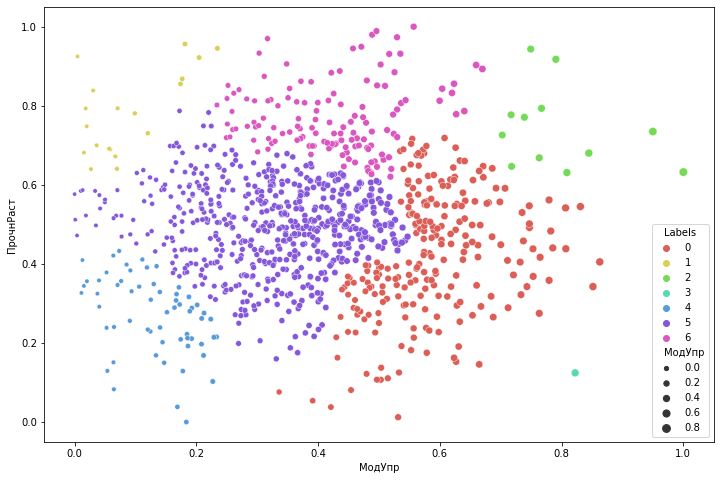

In [27]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=7, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['МодУпр'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['МодУпр'],
                palette=sns.color_palette('hls', 7))
plt.show()

In [28]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count(),X[X['Labels']==5].count(),X[X['Labels']==6]['ПрочнРаст'].head(20),

(МодУпр       234
 ПрочнРаст    234
 Labels       234
 dtype: int64,
 МодУпр       19
 ПрочнРаст    19
 Labels       19
 dtype: int64,
 МодУпр       12
 ПрочнРаст    12
 Labels       12
 dtype: int64,
 МодУпр       1
 ПрочнРаст    1
 Labels       1
 dtype: int64,
 МодУпр       60
 ПрочнРаст    60
 Labels       60
 dtype: int64,
 МодУпр       560
 ПрочнРаст    560
 Labels       560
 dtype: int64,
 0      0.698235
 1      0.698235
 2      0.698235
 3      0.698235
 4      0.698235
 5      0.698235
 6      0.698235
 24     0.949223
 27     0.719231
 34     0.729017
 35     0.765150
 46     0.843247
 57     0.753826
 67     0.683267
 68     0.832440
 73     0.745932
 83     0.663560
 87     0.774539
 98     0.796991
 106    0.973223
 Name: ПрочнРаст, dtype: float64)

In [29]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20),X[X['Labels']==4]['ПрочнРаст'].head(20),X[X['Labels']==5]['ПрочнРаст'].head(20),

(8     0.271429
 9     0.342563
 10    0.342563
 11    0.342563
 19    0.342563
 23    0.551464
 33    0.450606
 39    0.541612
 41    0.651495
 45    0.214490
 47    0.529936
 49    0.269906
 59    0.343290
 62    0.648537
 70    0.106904
 72    0.319201
 74    0.264540
 76    0.611853
 81    0.641660
 82    0.346239
 Name: ПрочнРаст, dtype: float64,
 71     0.639752
 99     0.956165
 209    0.780800
 249    0.793544
 286    0.700024
 332    0.748135
 335    0.921909
 395    0.855358
 523    0.924760
 611    0.681461
 613    0.730434
 654    0.945177
 655    0.689572
 768    0.640532
 927    0.671844
 957    0.691339
 958    0.868113
 985    0.838621
 993    0.793434
 Name: ПрочнРаст, dtype: float64,
 95      0.725931
 232     0.631015
 424     0.793493
 512     0.777175
 549     0.680353
 586     0.917481
 592     0.632194
 638     0.646632
 653     0.770908
 667     0.668333
 770     0.734869
 1008    0.943372
 Name: ПрочнРаст, dtype: float64,
 37    0.124386
 Name: ПрочнРаст, dtype

In [30]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.20015278187136895


In [31]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.20689454 0.33016769 0.17594626]
 [0.         0.         0.         ... 0.20689454 0.33016769 0.17594626]
 [0.         0.         0.         ... 0.20689454 0.33016769 0.17594626]
 ...
 [0.20689454 0.20689454 0.20689454 ... 0.         0.27042514 0.06879554]
 [0.33016769 0.33016769 0.33016769 ... 0.27042514 0.         0.32666217]
 [0.17594626 0.17594626 0.17594626 ... 0.06879554 0.32666217 0.        ]]


In [32]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_11304\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


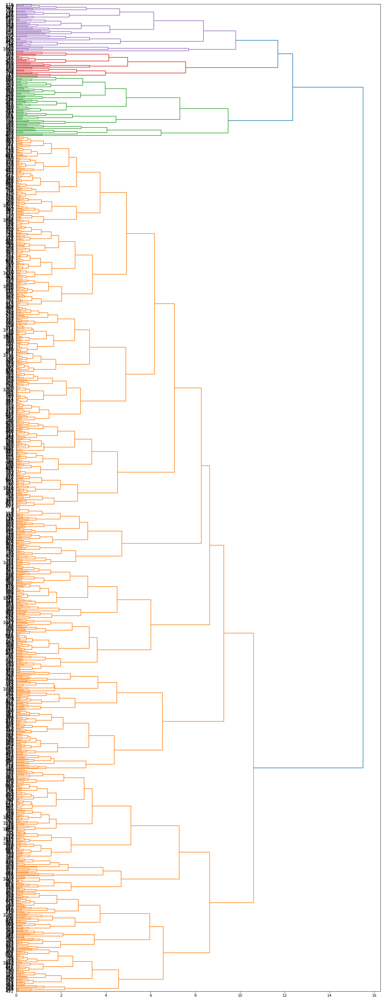

In [33]:
# dendrogram 
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

### DBSCAN

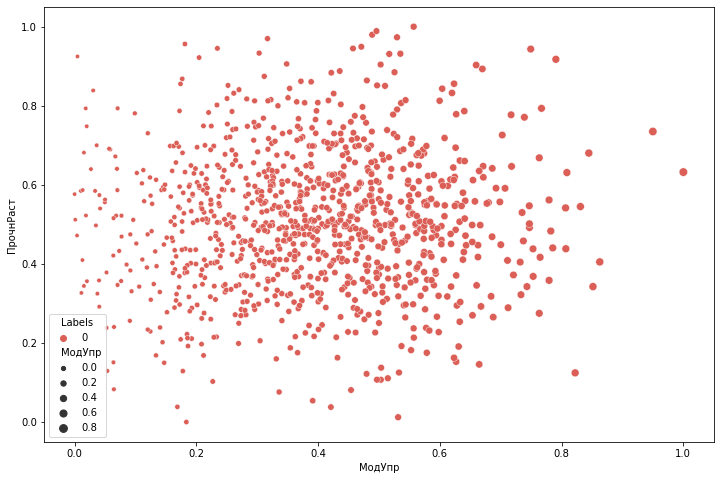

In [34]:
# кластеризация DBSCAN
from sklearn.cluster import DBSCAN 

db = DBSCAN(eps=10, min_samples=2).fit(X.drop(['Labels'], axis=1))

X['Labels'] = db.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['МодУпр'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['МодУпр'],
                palette=sns.color_palette('hls', np.unique(db.labels_).shape[0]))
plt.show()

In [35]:
# print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

### C-means

In [36]:
# C-mean подобно KMeans показывает кластеризацию параметров
X.drop(['Labels'], axis=1, inplace=True)
fcm = FCM(n_clusters=4)
fcm.fit(X.values)

fcm_centers = fcm.centers
fcm_labels = fcm.predict(X.values) 

In [37]:
X['Labels'] = fcm_labels

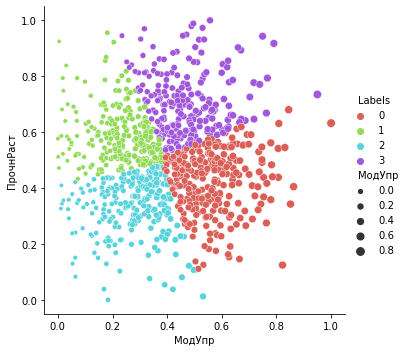

In [38]:
sns.relplot(x='МодУпр', y='ПрочнРаст', hue='Labels', 
            size='МодУпр', data=X, palette = sns.color_palette('hls', 4))

In [39]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

(МодУпр       290
 ПрочнРаст    290
 Labels       290
 dtype: int64,
 МодУпр       249
 ПрочнРаст    249
 Labels       249
 dtype: int64,
 МодУпр       243
 ПрочнРаст    243
 Labels       243
 dtype: int64,
 МодУпр       241
 ПрочнРаст    241
 Labels       241
 dtype: int64)

In [40]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20)

(8     0.271429
 9     0.342563
 10    0.342563
 11    0.342563
 12    0.504591
 14    0.504591
 19    0.342563
 23    0.551464
 26    0.510862
 30    0.502239
 33    0.450606
 37    0.124386
 39    0.541612
 43    0.461906
 47    0.529936
 48    0.506003
 49    0.269906
 53    0.542289
 59    0.343290
 72    0.319201
 Name: ПрочнРаст, dtype: float64,
 13     0.504591
 15     0.698235
 16     0.698235
 21     0.504591
 22     0.504591
 25     0.564512
 27     0.719231
 29     0.593114
 32     0.507099
 40     0.644347
 52     0.497733
 55     0.585983
 57     0.753826
 61     0.522293
 64     0.699905
 67     0.683267
 71     0.639752
 91     0.546588
 99     0.956165
 100    0.554787
 Name: ПрочнРаст, dtype: float64,
 7     0.271429
 17    0.271429
 18    0.271429
 20    0.342563
 28    0.445341
 36    0.303619
 42    0.421020
 44    0.436028
 45    0.214490
 50    0.348433
 51    0.377301
 54    0.456669
 60    0.394141
 63    0.431556
 65    0.209087
 66    0.428445
 69    0.401032


In [41]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.311865162314079


Проверка значимости различия групп по критерию Краскала-Уоллиса

In [42]:
# индексация кластеров
filter_0 = X[X['Labels']==0].index
filter_1 = X[X['Labels']==1].index
filter_2 = X[X['Labels']==2].index
filter_3 = X[X['Labels']==3].index

In [43]:
# выделение объектов np.array
df_0 = np.array(df_s['ПрочнРаст'][filter_0].reset_index(drop=True))
df_1 = np.array(df_s['ПрочнРаст'][filter_1].reset_index(drop=True))
df_2 = np.array(df_s['ПрочнРаст'][filter_2].reset_index(drop=True))
df_3 = np.array(df_s['ПрочнРаст'][filter_3].reset_index(drop=True))

In [44]:
# критерий Краскала-Уоллиса
stats.mstats.kruskalwallis(df_0,df_1,df_2,df_3)

KruskalResult(statistic=748.8469607231197, pvalue=5.366164413836229e-162)

Вывод: различия по группам значимы для параметра 'ПрочнРаст'

Создание новых датасетов для обработки:

In [45]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df_s.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [46]:
# Формирование DataFrame
ddf_0 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_0])
ddf_0.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_0.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,3.557018,1930.000000,889.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,7.0,57.0
1,3.532338,2100.000000,1421.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,7.0,60.0
2,2.919678,2160.000000,933.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,7.0,70.0
3,2.877358,1990.000000,1628.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,9.0,47.0
4,1.598174,1950.000000,827.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.0,57.0
5,4.029126,1910.000000,800.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.0,70.0
6,3.532338,1980.000000,1183.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,0.0,0.0,0.0
7,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117,1.0,4.0,70.0
8,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561,1.0,5.0,60.0
9,1.978140,1973.629097,991.724095,149.372128,19.750578,232.058191,485.453778,75.665701,2448.943079,162.493694,1.0,7.0,60.0


In [47]:
# Формирование DataFrame
ddf_1 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_1])
ddf_1.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_1.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.919678,1980.000000,568.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.000000,60.000000
1,2.934783,2030.000000,302.000000,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,10.000000,47.000000
2,3.557018,1880.000000,313.000000,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,10.000000,57.000000
3,1.598174,1920.000000,456.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,1.0,4.000000,57.000000
4,4.029126,1880.000000,622.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,1.0,4.000000,60.000000
5,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556,1.0,5.000000,57.000000
6,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880,1.0,5.000000,70.000000
7,2.282825,2008.357592,393.967325,149.372832,21.661751,330.498641,535.371459,72.244924,2704.445081,261.077072,1.0,7.000000,57.000000
8,3.277087,2010.047012,339.550423,67.498993,24.280609,254.949084,117.535234,67.478707,2462.605386,207.018581,1.0,9.000000,47.000000
9,3.034399,1968.401388,455.871019,61.421297,23.490723,316.414572,637.376893,75.090372,2848.490078,311.052398,0.0,7.856167,64.301964


In [48]:
# Формирование DataFrame
ddf_2 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_2])
ddf_2.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_2.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.561475,1900.000000,535.000000,111.860000,22.267857,284.615385,380.000000,75.000000,1800.000000,120.000000,0.0,7.000000,47.000000
1,4.193548,1950.000000,506.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,10.000000,60.000000
2,4.897959,1890.000000,540.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,10.000000,70.000000
3,2.877358,2000.000000,205.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,1.0,4.000000,47.000000
4,2.709554,1892.071124,641.052549,96.563293,22.989291,262.956722,804.592621,74.511359,2288.967377,126.816339,1.0,7.000000,47.000000
5,2.423876,1908.940601,530.228686,58.262414,24.073549,325.138688,456.908047,74.244354,1890.505807,222.699487,1.0,10.000000,47.000000
6,2.664389,1996.159145,525.057774,77.506883,18.126107,223.408685,28.658102,69.489773,2220.587445,314.776669,0.0,6.675780,78.623299
7,2.914333,2049.373404,382.263359,81.352047,16.391595,233.296063,561.992131,69.814615,2262.784366,303.075452,0.0,8.325699,46.045428
8,4.315666,1913.379677,822.918735,143.576937,24.275588,274.988794,260.859341,75.957329,1639.912525,248.244330,0.0,7.656211,33.571024
9,3.057830,1987.259859,403.395230,112.719826,19.390511,336.245384,352.831984,73.016489,2016.503637,206.693379,0.0,6.303773,72.152019


In [49]:
# Формирование DataFrame
ddf_3 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_3])
ddf_3.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_3.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.0,57.0
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.0,60.0
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.0,70.0
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.0,47.0
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.0,57.0
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.0,60.0
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.0,70.0
7,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,1.0,5.0,47.0
8,1.771436,1872.491560,801.033883,79.794548,22.296304,340.736898,864.929184,70.947592,2796.785402,123.356264,1.0,7.0,70.0
9,2.916150,1879.969846,1003.270178,109.239530,25.682759,294.048537,408.354239,71.700856,3086.546196,192.191162,1.0,9.0,60.0


In [50]:
# Вывод сведений о новом объекте DataFrame ddf_0, метод info()
ddf_0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 290 entries, 0 to 289
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       290 non-null    float64
 1   Плотность, кг/м3                      290 non-null    float64
 2   модуль упругости, ГПа                 290 non-null    float64
 3   Количество отвердителя, м.%           290 non-null    float64
 4   Содержание эпоксидных групп,%_2       290 non-null    float64
 5   Температура вспышки, С_2              290 non-null    float64
 6   Поверхностная плотность, г/м2         290 non-null    float64
 7   Модуль упругости при растяжении, ГПа  290 non-null    float64
 8   Прочность при растяжении, МПа         290 non-null    float64
 9   Потребление смолы, г/м2               290 non-null    float64
 10  Угол нашивки, град                    290 non-null    float64
 11  Шаг нашивки        

In [51]:
# Вывод сведений о новом объекте DataFrame ddf_1, метод info()
ddf_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249 entries, 0 to 248
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       249 non-null    float64
 1   Плотность, кг/м3                      249 non-null    float64
 2   модуль упругости, ГПа                 249 non-null    float64
 3   Количество отвердителя, м.%           249 non-null    float64
 4   Содержание эпоксидных групп,%_2       249 non-null    float64
 5   Температура вспышки, С_2              249 non-null    float64
 6   Поверхностная плотность, г/м2         249 non-null    float64
 7   Модуль упругости при растяжении, ГПа  249 non-null    float64
 8   Прочность при растяжении, МПа         249 non-null    float64
 9   Потребление смолы, г/м2               249 non-null    float64
 10  Угол нашивки, град                    249 non-null    float64
 11  Шаг нашивки        

In [52]:
# Вывод сведений о новом объекте DataFrame ddf_2, метод info()
ddf_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243 entries, 0 to 242
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       243 non-null    float64
 1   Плотность, кг/м3                      243 non-null    float64
 2   модуль упругости, ГПа                 243 non-null    float64
 3   Количество отвердителя, м.%           243 non-null    float64
 4   Содержание эпоксидных групп,%_2       243 non-null    float64
 5   Температура вспышки, С_2              243 non-null    float64
 6   Поверхностная плотность, г/м2         243 non-null    float64
 7   Модуль упругости при растяжении, ГПа  243 non-null    float64
 8   Прочность при растяжении, МПа         243 non-null    float64
 9   Потребление смолы, г/м2               243 non-null    float64
 10  Угол нашивки, град                    243 non-null    float64
 11  Шаг нашивки        

In [53]:
# Вывод сведений о новом объекте DataFrame ddf_3, метод info()
ddf_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241 entries, 0 to 240
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       241 non-null    float64
 1   Плотность, кг/м3                      241 non-null    float64
 2   модуль упругости, ГПа                 241 non-null    float64
 3   Количество отвердителя, м.%           241 non-null    float64
 4   Содержание эпоксидных групп,%_2       241 non-null    float64
 5   Температура вспышки, С_2              241 non-null    float64
 6   Поверхностная плотность, г/м2         241 non-null    float64
 7   Модуль упругости при растяжении, ГПа  241 non-null    float64
 8   Прочность при растяжении, МПа         241 non-null    float64
 9   Потребление смолы, г/м2               241 non-null    float64
 10  Угол нашивки, град                    241 non-null    float64
 11  Шаг нашивки        

In [54]:
# Изменение типа данных индекса, метод astype('int')
ddf_0.index = ddf_0.index.astype('int')

In [55]:
# Изменение типа данных индекса, метод astype('int')
ddf_1.index = ddf_1.index.astype('int')

In [56]:
# Изменение типа данных индекса, метод astype('int')
ddf_2.index = ddf_2.index.astype('int')

In [57]:
# Изменение типа данных индекса, метод astype('int')
ddf_3.index = ddf_3.index.astype('int')

In [58]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(ddf_0.isnull().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64


In [59]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(ddf_1.isnull().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64


In [60]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(ddf_2.isnull().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64


In [61]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(ddf_3.isnull().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64


Вывод: пропуски в датасетах отсутствуют

In [62]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
ddf_0.duplicated().sum()

0

In [63]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
ddf_1.duplicated().sum()

0

In [64]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
ddf_2.duplicated().sum()

0

In [65]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
ddf_3.duplicated().sum()

0

Выводы: дубликаты в датасетах отсутствуют

In [66]:
# Определение количества строк и столбцов датасета df_s, метод shape
ddf_0.shape

(290, 13)

In [67]:
# Определение количества строк и столбцов датасета df_s, метод shape
ddf_1.shape

(249, 13)

In [68]:
# Определение количества строк и столбцов датасета df_s, метод shape
ddf_2.shape

(243, 13)

In [69]:
# Определение количества строк и столбцов датасета df_s, метод shape
ddf_3.shape

(241, 13)

In [70]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
ddf_0.nunique()

Соотношение матрица-наполнитель         289
Плотность, кг/м3                        290
модуль упругости, ГПа                   290
Количество отвердителя, м.%             285
Содержание эпоксидных групп,%_2         285
Температура вспышки, С_2                285
Поверхностная плотность, г/м2           286
Модуль упругости при растяжении, ГПа    286
Прочность при растяжении, МПа           286
Потребление смолы, г/м2                 286
Угол нашивки, град                        2
Шаг нашивки                             283
Плотность нашивки                       282
dtype: int64

In [71]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
ddf_1.nunique()

Соотношение матрица-наполнитель         249
Плотность, кг/м3                        248
модуль упругости, ГПа                   249
Количество отвердителя, м.%             246
Содержание эпоксидных групп,%_2         246
Температура вспышки, С_2                246
Поверхностная плотность, г/м2           246
Модуль упругости при растяжении, ГПа    246
Прочность при растяжении, МПа           246
Потребление смолы, г/м2                 245
Угол нашивки, град                        2
Шаг нашивки                             245
Плотность нашивки                       244
dtype: int64

In [72]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
ddf_2.nunique()

Соотношение матрица-наполнитель         243
Плотность, кг/м3                        243
модуль упругости, ГПа                   243
Количество отвердителя, м.%             241
Содержание эпоксидных групп,%_2         241
Температура вспышки, С_2                241
Поверхностная плотность, г/м2           241
Модуль упругости при растяжении, ГПа    241
Прочность при растяжении, МПа           241
Потребление смолы, г/м2                 241
Угол нашивки, град                        2
Шаг нашивки                             240
Плотность нашивки                       240
dtype: int64

In [73]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
ddf_3.nunique()

Соотношение матрица-наполнитель         238
Плотность, кг/м3                        237
модуль упругости, ГПа                   238
Количество отвердителя, м.%             239
Содержание эпоксидных групп,%_2         238
Температура вспышки, С_2                237
Поверхностная плотность, г/м2           235
Модуль упругости при растяжении, ГПа    235
Прочность при растяжении, МПа           235
Потребление смолы, г/м2                 235
Угол нашивки, град                        2
Шаг нашивки                             234
Плотность нашивки                       233
dtype: int64

In [74]:
# Определение уникальных значений в столбце 'Угол нашивки, град', метод unique()
ddf_0['Угол нашивки, град'].unique()

array([0., 1.])

In [75]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_0.dtypes['Угол нашивки, град']

dtype('float64')

In [76]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_0['Угол нашивки, град'] = ddf_0['Угол нашивки, град'].astype(int)

In [77]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_0.dtypes['Угол нашивки, град']

dtype('int32')

In [78]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_1['Угол нашивки, град'] = ddf_1['Угол нашивки, град'].astype(int)

In [79]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_1.dtypes['Угол нашивки, град']

dtype('int32')

In [80]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_2['Угол нашивки, град'] = ddf_2['Угол нашивки, град'].astype(int)

In [81]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_2.dtypes['Угол нашивки, град']

dtype('int32')

In [82]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_3['Угол нашивки, град'] = ddf_3['Угол нашивки, град'].astype(int)

In [83]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_3.dtypes['Угол нашивки, град']

dtype('int32')

In [84]:
# Описательная статистика датасета df_s, метод describe()
ddf_0.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000
mean,2.918869,1977.568265,1059.729265,114.216214,22.162182,288.625389,485.328155,73.431022,2241.649580,217.748976,0.493103,6.757253,57.944591
std,0.966172,72.541823,203.608880,26.112222,2.383281,40.655558,283.034925,3.268365,296.525117,58.965180,0.500817,2.713629,12.774146
min,0.790499,1740.657496,741.037038,33.624187,15.881668,179.374391,1.668002,66.421070,1348.288251,33.803026,0.000000,0.000000,0.000000
25%,2.160071,1923.332909,902.294967,97.583292,20.554570,260.568045,269.701957,71.140128,2050.402213,179.875097,0.000000,5.033289,50.031369
50%,2.900344,1981.090227,1036.126432,114.045210,22.232383,288.370202,465.522876,73.020275,2305.298644,219.344755,0.000000,6.876353,58.199385
75%,3.552227,2020.622631,1169.268942,131.946596,23.796655,318.415249,682.356711,75.332674,2446.685753,257.388384,1.000000,8.592569,65.647955
max,5.591742,2192.297637,1911.536477,192.705385,28.848902,396.898222,1230.465214,82.682051,2949.723274,383.663401,1.000000,13.732404,98.202603


In [85]:
# Описательная статистика датасета df_s, метод describe()
ddf_1.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000
mean,2.902785,1971.968377,436.596084,109.243754,22.147768,282.571825,484.531626,73.133834,2689.157547,217.564694,0.497992,6.793692,55.694752
std,0.906576,76.402864,189.323280,27.506661,2.458450,41.741159,278.490046,2.969008,264.462978,60.935378,0.501003,2.525989,12.179435
min,0.389403,1801.940695,2.436909,35.599697,14.254985,187.977965,6.986693,64.696400,2253.684145,41.048278,0.000000,0.239660,11.740126
25%,2.274592,1918.698103,327.695625,89.995476,20.327411,254.396001,257.855075,71.306992,2482.710947,177.732791,0.000000,5.000000,48.731020
50%,2.896634,1970.518139,453.458891,109.117129,22.118429,281.467572,464.720310,73.119552,2645.789989,215.939203,0.000000,6.755935,55.948455
75%,3.552902,2018.231213,597.205243,130.165094,23.724446,307.840838,688.874406,75.151340,2820.327742,257.495622,1.000000,8.301440,63.078186
max,5.258895,2207.773481,750.627517,192.334469,28.907470,413.273418,1391.032409,80.239609,3725.190760,402.163809,1.000000,14.376451,92.963492


In [86]:
# Описательная статистика датасета df_s, метод describe()
ddf_2.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000
mean,2.940097,1981.747442,517.591302,111.150977,22.395633,286.644402,478.639758,73.296575,1972.597150,217.277948,0.497942,7.369391,56.610441
std,0.897980,67.991784,205.578168,29.199625,2.448210,39.271791,277.562486,3.150888,283.656101,59.947052,0.501028,2.520472,12.396629
min,0.596783,1731.764635,23.614603,32.019222,16.391595,186.508613,0.603740,64.054061,1036.856605,63.685698,0.000000,0.268756,20.571633
25%,2.339301,1933.463135,364.111849,93.075849,20.670714,264.589826,274.729763,71.505598,1828.103332,176.733358,0.000000,5.523826,49.144513
50%,2.927905,1984.954030,536.663039,111.860000,22.283904,285.319055,422.070244,73.662132,2016.503637,216.444806,0.000000,7.382023,57.536611
75%,3.507649,2027.600228,678.880232,129.326788,24.180053,311.991908,701.782006,75.294995,2187.231079,257.330831,1.000000,9.041344,65.139746
max,5.425139,2182.751822,1016.976050,198.953207,28.620116,370.823575,1288.691844,80.419862,2380.258563,414.590628,1.000000,13.371039,103.988901


In [87]:
# Описательная статистика датасета df_s, метод describe()
ddf_3.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000
mean,2.962885,1971.357840,892.667507,106.970175,22.290643,285.232796,481.874125,73.438753,3006.814744,221.276028,0.477178,6.705019,58.258124
std,0.873381,77.740507,205.649919,30.259018,2.342005,42.084694,287.536802,3.062222,303.823801,59.475189,0.500518,2.412303,11.847825
min,0.463342,1784.482245,450.162904,17.740275,15.695894,100.000000,6.779255,65.793845,2543.236909,64.524180,0.000000,1.417184,19.250533
25%,2.424798,1920.337789,748.000000,90.409550,20.715839,260.527628,245.605828,71.215032,2754.515879,182.599404,0.000000,5.000000,51.273989
50%,2.903233,1970.688669,862.687353,108.045473,22.267857,285.955223,463.601093,73.495350,2974.470102,220.000000,0.000000,6.709407,58.863855
75%,3.563509,2019.574351,995.548767,126.919152,23.882251,313.184981,690.360913,75.516671,3193.923461,256.737402,1.000000,8.285425,66.539578
max,5.295842,2184.493200,1815.865170,190.318107,33.000000,397.151291,1399.542362,82.525773,3848.436732,378.756879,1.000000,14.440522,89.876616


###### Построение графиков рассеяния и распределения переменных, а также графиков "ящики с усами"

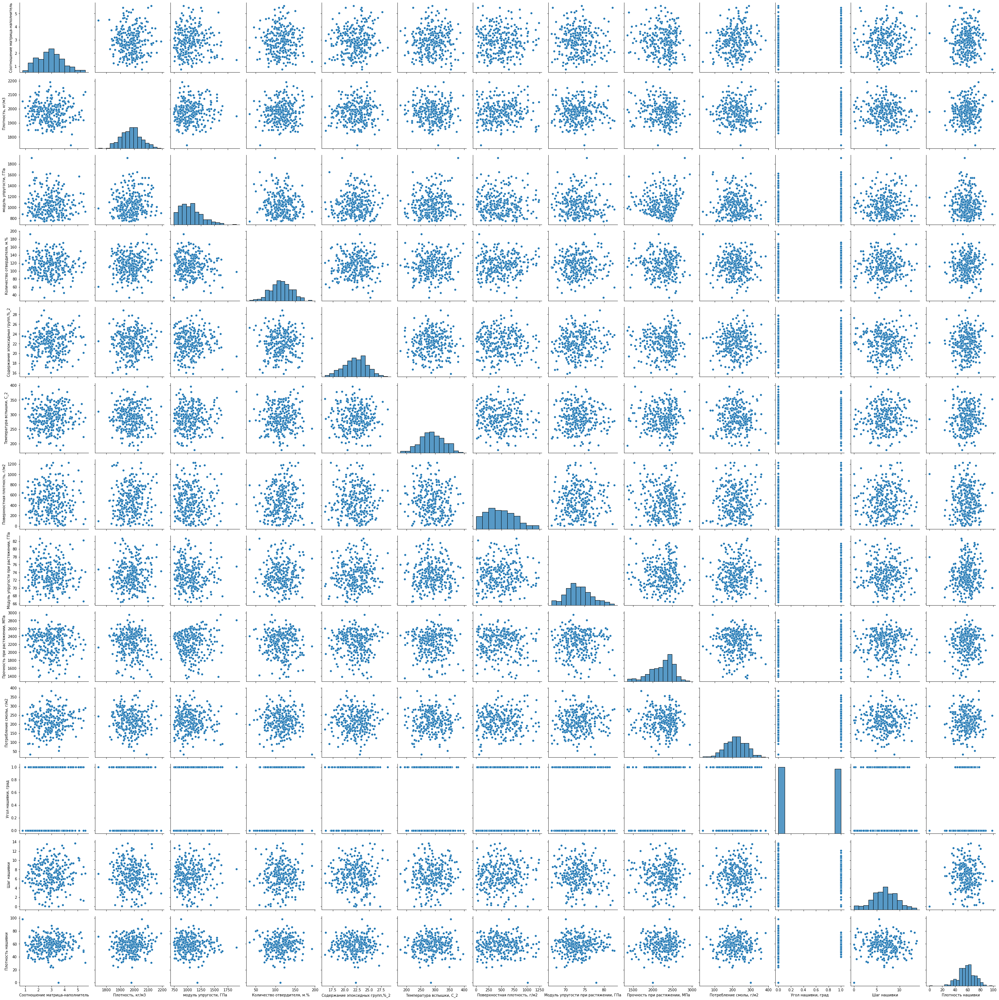

In [88]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_0, height=3)

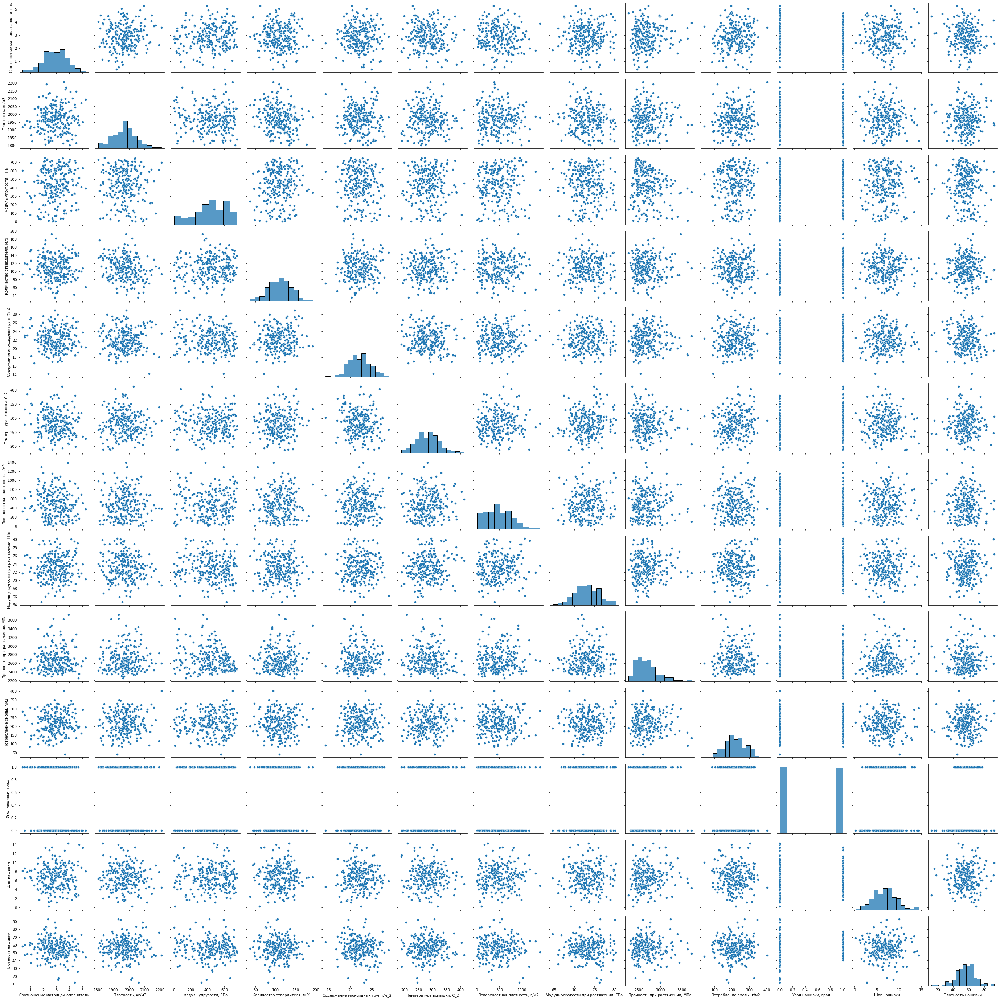

In [89]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_1, height=3)

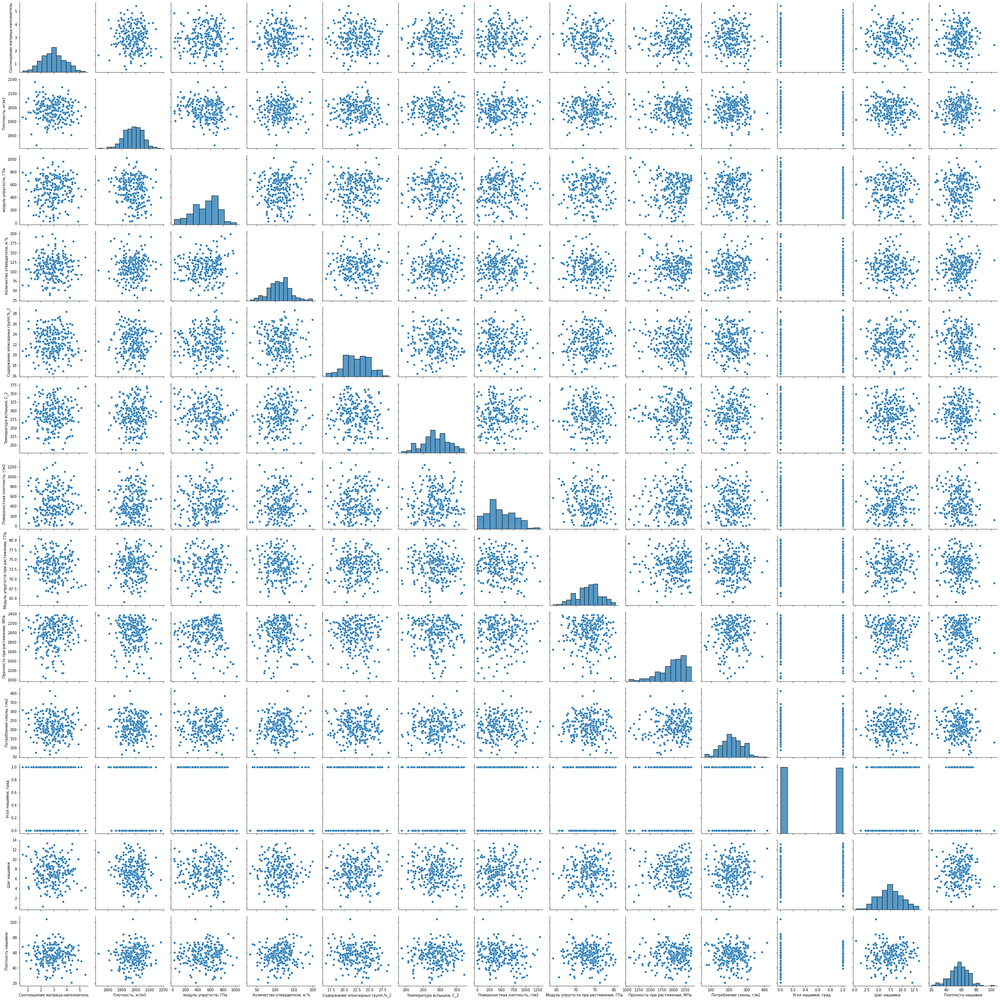

In [90]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_2, height=3)

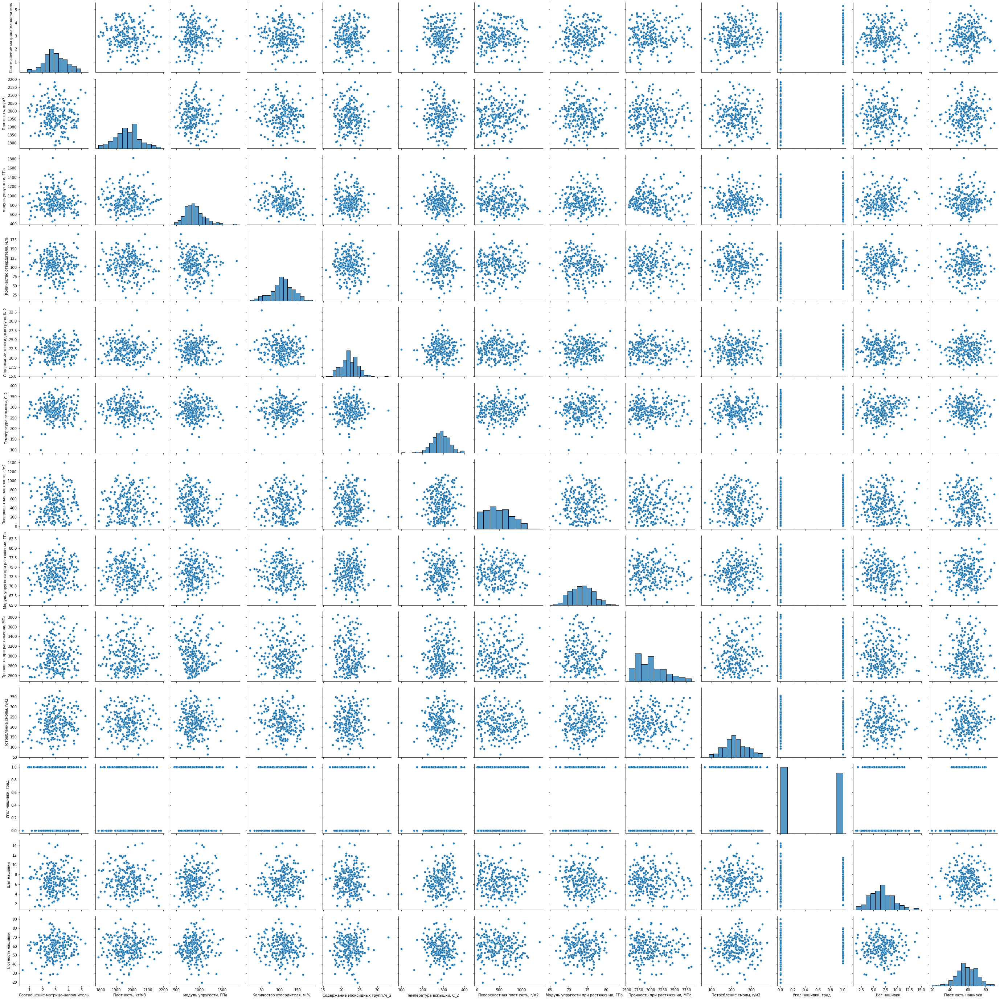

In [91]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_3, height=3)

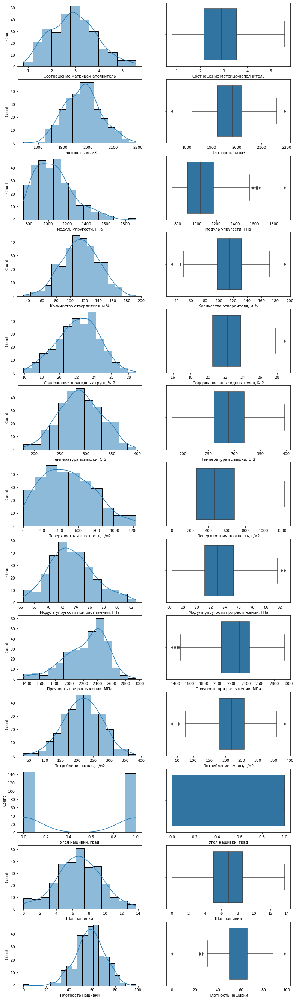

In [92]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_0.columns):    
    sns.histplot(data=ddf_0, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_0, x=column, ax=axes[k, 1])
plt.show()

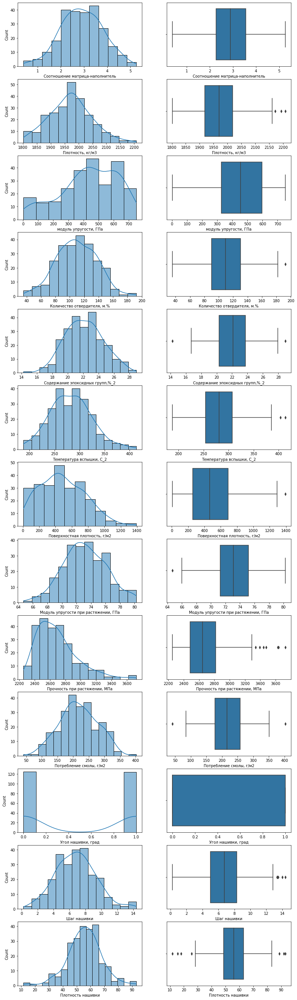

In [93]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_1.columns):    
    sns.histplot(data=ddf_1, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_1, x=column, ax=axes[k, 1])
plt.show()

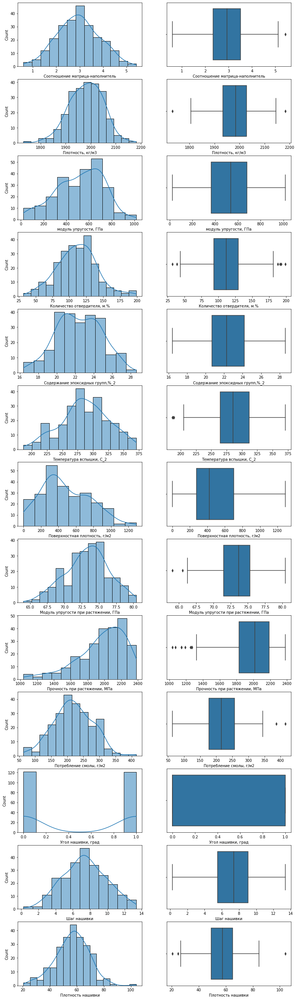

In [94]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_2.columns):    
    sns.histplot(data=ddf_2, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_2, x=column, ax=axes[k, 1])
plt.show()

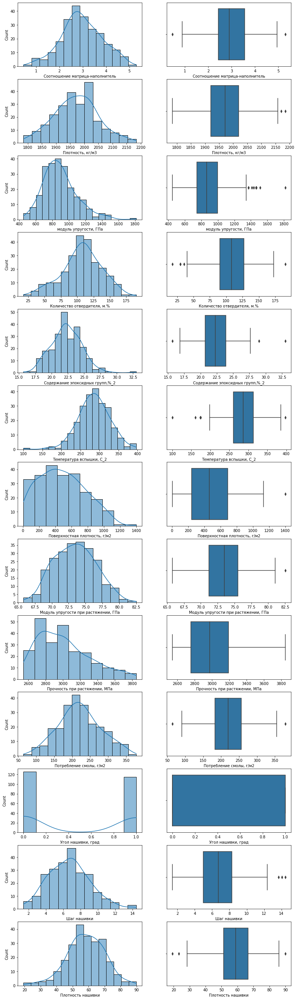

In [95]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_3.columns):    
    sns.histplot(data=ddf_3, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_3, x=column, ax=axes[k, 1])
plt.show()

Вывод:

Параметр 'Угол нашивки' - категориальный, поэтому требуется его исключение при оценке нормальности распределения и для построения матрицы корреляции по критерию Пирсона

In [96]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_0d=ddf_0[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [97]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_1d=ddf_1[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [98]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_2d=ddf_2[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [99]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_3d=ddf_3[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [100]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
ddf_0d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [101]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
ddf_1d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [102]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
ddf_2d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [103]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
ddf_3d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

### 3. Оценка корреляции параметров

Корреляция для количественных параметров и количественно-категориальных оценивается по критериям Пирсона и Спирмена соответственно

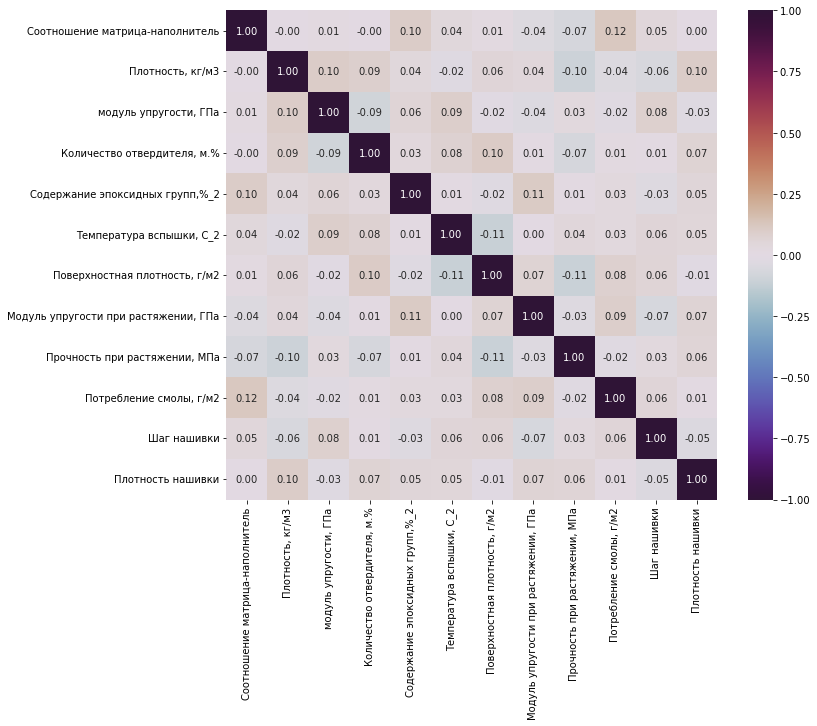

In [104]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_0d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

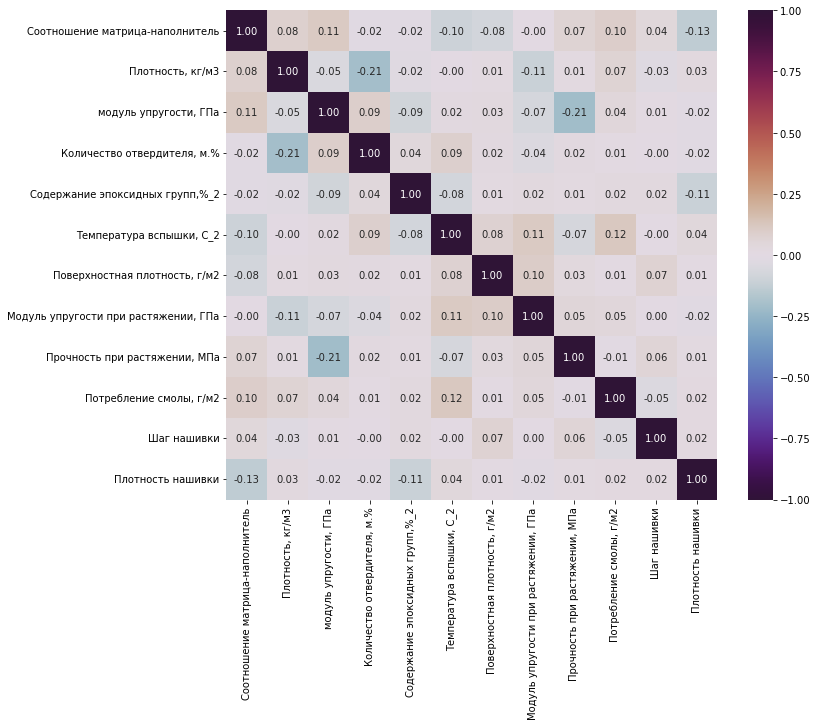

In [105]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_1d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

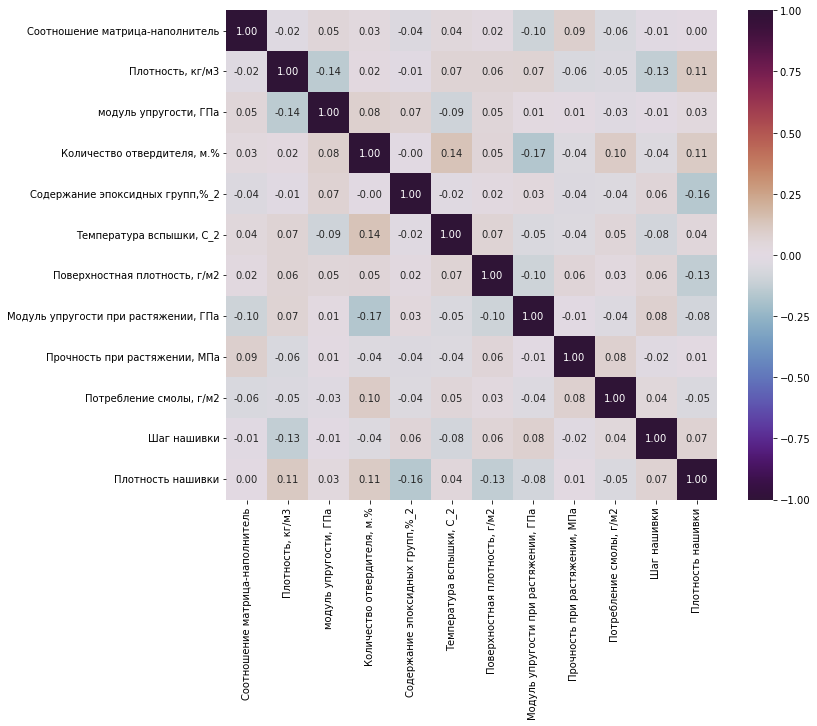

In [106]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_2d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

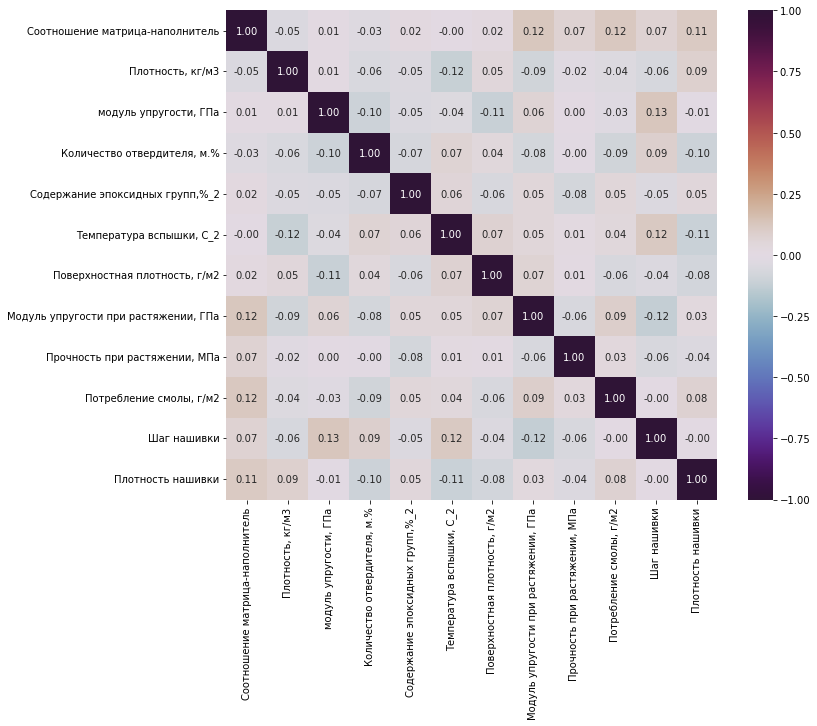

In [107]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_3d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

### 5. Построение моделей статистической регрессии

In [108]:
# Загрузка библиотек sklearn для проведения регрессионного анализа
import sklearn.linear_model as lm
import statsmodels.formula.api as smf

###### Анализ общей модели множественной регрессии

In [109]:
# Создание нового датасета ff для модели множественной регрессии
ff0 = ddf_0
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff0 = ff0.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff0.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,3.557018,1930.0,889.0,129.0,21.25,300.0,380.0,75.000000,1800.000000,120.0,0,7.0,57.0
1,3.532338,2100.0,1421.0,129.0,21.25,300.0,1010.0,78.000000,2000.000000,300.0,0,7.0,60.0
2,2.919678,2160.0,933.0,129.0,21.25,300.0,1010.0,78.000000,2000.000000,300.0,0,7.0,70.0
3,2.877358,1990.0,1628.0,129.0,21.25,300.0,1010.0,78.000000,2000.000000,300.0,0,9.0,47.0
4,1.598174,1950.0,827.0,129.0,21.25,300.0,470.0,73.333333,2455.555556,220.0,0,9.0,57.0


In [110]:
# Создание нового датасета ff для модели множественной регрессии
ff1 = ddf_1
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff1 = ff1.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff1.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,2.919678,1980.0,568.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,60.0
1,2.934783,2030.0,302.0,129.00,21.250000,300.000000,210.0,70.000000,3000.000000,220.0,0,10.0,47.0
2,3.557018,1880.0,313.0,129.00,21.250000,300.000000,210.0,70.000000,3000.000000,220.0,0,10.0,57.0
3,1.598174,1920.0,456.0,111.86,22.267857,284.615385,470.0,73.333333,2455.555556,220.0,1,4.0,57.0
4,4.029126,1880.0,622.0,111.86,22.267857,284.615385,470.0,73.333333,2455.555556,220.0,1,4.0,60.0


In [111]:
# Создание нового датасета ff для модели множественной регрессии
ff2 = ddf_2
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff2 = ff2.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff2.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,2.561475,1900.000000,535.000000,111.860000,22.267857,284.615385,380.000000,75.000000,1800.000000,120.000000,0,7.0,47.0
1,4.193548,1950.000000,506.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0,10.0,60.0
2,4.897959,1890.000000,540.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0,10.0,70.0
3,2.877358,2000.000000,205.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,1,4.0,47.0
4,2.709554,1892.071124,641.052549,96.563293,22.989291,262.956722,804.592621,74.511359,2288.967377,126.816339,1,7.0,47.0


In [112]:
# Создание нового датасета ff для модели множественной регрессии
ff3 = ddf_3
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff3 = ff3.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff3.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [113]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff0 = pd.concat((ff0,pd.get_dummies(ff0.col11, prefix="col11", prefix_sep='',)),1)
ff0.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_11304\3663672012.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff0 = pd.concat((ff0,pd.get_dummies(ff0.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,3.557018,1930.0,889.0,129.0,21.25,300.0,380.0,75.000000,1800.000000,120.0,0,7.0,57.0,1,0
1,3.532338,2100.0,1421.0,129.0,21.25,300.0,1010.0,78.000000,2000.000000,300.0,0,7.0,60.0,1,0
2,2.919678,2160.0,933.0,129.0,21.25,300.0,1010.0,78.000000,2000.000000,300.0,0,7.0,70.0,1,0
3,2.877358,1990.0,1628.0,129.0,21.25,300.0,1010.0,78.000000,2000.000000,300.0,0,9.0,47.0,1,0
4,1.598174,1950.0,827.0,129.0,21.25,300.0,470.0,73.333333,2455.555556,220.0,0,9.0,57.0,1,0


In [114]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff1 = pd.concat((ff1,pd.get_dummies(ff1.col11, prefix="col11", prefix_sep='',)),1)
ff1.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_11304\2177107136.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff1 = pd.concat((ff1,pd.get_dummies(ff1.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,2.919678,1980.0,568.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,60.0,1,0
1,2.934783,2030.0,302.0,129.00,21.250000,300.000000,210.0,70.000000,3000.000000,220.0,0,10.0,47.0,1,0
2,3.557018,1880.0,313.0,129.00,21.250000,300.000000,210.0,70.000000,3000.000000,220.0,0,10.0,57.0,1,0
3,1.598174,1920.0,456.0,111.86,22.267857,284.615385,470.0,73.333333,2455.555556,220.0,1,4.0,57.0,0,1
4,4.029126,1880.0,622.0,111.86,22.267857,284.615385,470.0,73.333333,2455.555556,220.0,1,4.0,60.0,0,1


In [115]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff2 = pd.concat((ff2,pd.get_dummies(ff2.col11, prefix="col11", prefix_sep='',)),1)
ff2.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_11304\1420413336.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff2 = pd.concat((ff2,pd.get_dummies(ff2.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,2.561475,1900.000000,535.000000,111.860000,22.267857,284.615385,380.000000,75.000000,1800.000000,120.000000,0,7.0,47.0,1,0
1,4.193548,1950.000000,506.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0,10.0,60.0,1,0
2,4.897959,1890.000000,540.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0,10.0,70.0,1,0
3,2.877358,2000.000000,205.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,1,4.0,47.0,0,1
4,2.709554,1892.071124,641.052549,96.563293,22.989291,262.956722,804.592621,74.511359,2288.967377,126.816339,1,7.0,47.0,0,1


In [116]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff3 = pd.concat((ff3,pd.get_dummies(ff3.col11, prefix="col11", prefix_sep='',)),1)
ff3.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_11304\347822830.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff3 = pd.concat((ff3,pd.get_dummies(ff3.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,1,0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,1,0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,1,0


In [117]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff0).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.041
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9965
Date:                Sun, 09 Apr 2023   Prob (F-statistic):              0.452
Time:                        19:57:24   Log-Likelihood:                -748.31
No. Observations:                 290   AIC:                             1523.
Df Residuals:                     277   BIC:                             1570.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     67.1563      6.127     10.961      0.000      55.095      79.217
col1          -0.2213      0.203     -1.093      0.276      -0.620       0.177
col2           0.0017      0.003      0.617      0.538      -0.004       0.007
col3          -0.0006      0.001     -0.638      0.524      -0.003       0.001
col4          -0.0025      0.008     -0.325      0.746      -0.017       0.012
col5           0.1485      0.082      1.821      0.070      -0.012       0.309
col6           0.0017      0.005      0.343      0.732      -0.008       0.011
col7           0.0008      0.001      1.123      0.262      -0.001       0.002
col9          -0.0004      0.001     -0.611      0.542      -0.002       0.001
col10          0.0054      0.003      1.620      0.106      -0.001       0.012
col12         -0.0740      0.072     -1.031      0.304      -0.215       0.067
col13          0.0135      0.015      0.881      0.379      -0.017       0.044
col110        -0.2936      0.396     -0.741      0.459      -1.074       0.486
==============================================================================
Omnibus:                        7.514   Durbin-Watson:                   1.847
Prob(Omnibus):                  0.023   Jarque-Bera (JB):                7.785
Skew:                           0.394   Prob(JB):                       0.0204
Kurtosis:                       2.847   Cond. No.                     1.03e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.03e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [118]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff1).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.090
Date:                Sun, 09 Apr 2023   Prob (F-statistic):              0.369
Time:                        19:57:24   Log-Likelihood:                -617.06
No. Observations:                 249   AIC:                             1260.
Df Residuals:                     236   BIC:                             1306.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     79.5536      6.108     13.025      0.000      67.521      91.586
col1           0.0799      0.216      0.370      0.711      -0.345       0.505
col2          -0.0053      0.003     -2.078      0.039      -0.010      -0.000
col3          -0.0012      0.001     -1.111      0.267      -0.003       0.001
col4          -0.0085      0.007     -1.204      0.230      -0.022       0.005
col5           0.0267      0.078      0.343      0.732      -0.127       0.180
col6           0.0087      0.005      1.867      0.063      -0.000       0.018
col7           0.0011      0.001      1.544      0.124      -0.000       0.002
col9           0.0005      0.001      0.649      0.517      -0.001       0.002
col10          0.0021      0.003      0.682      0.496      -0.004       0.008
col12         -0.0109      0.075     -0.145      0.885      -0.159       0.137
col13         -0.0028      0.016     -0.173      0.863      -0.034       0.029
col110         0.2731      0.388      0.703      0.483      -0.492       1.038
==============================================================================
Omnibus:                        0.411   Durbin-Watson:                   2.118
Prob(Omnibus):                  0.814   Jarque-Bera (JB):                0.545
Skew:                          -0.068   Prob(JB):                        0.761
Kurtosis:                       2.816   Cond. No.                     1.11e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.11e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [119]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff2).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.070
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     1.453
Date:                Sun, 09 Apr 2023   Prob (F-statistic):              0.143
Time:                        19:57:24   Log-Likelihood:                -614.31
No. Observations:                 243   AIC:                             1255.
Df Residuals:                     230   BIC:                             1300.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     66.5770      6.947      9.583      0.000      52.889      80.265
col1          -0.3101      0.227     -1.366      0.173      -0.758       0.137
col2           0.0052      0.003      1.672      0.096      -0.001       0.011
col3           0.0008      0.001      0.815      0.416      -0.001       0.003
col4          -0.0155      0.007     -2.187      0.030      -0.030      -0.002
col5           0.0097      0.084      0.116      0.908      -0.155       0.174
col6          -0.0007      0.005     -0.143      0.886      -0.011       0.010
col7          -0.0013      0.001     -1.783      0.076      -0.003       0.000
col9           0.0001      0.001      0.192      0.848      -0.001       0.002
col10         -0.0014      0.003     -0.420      0.675      -0.008       0.005
col12          0.1250      0.082      1.532      0.127      -0.036       0.286
col13         -0.0262      0.017     -1.517      0.131      -0.060       0.008
col110        -0.0905      0.416     -0.218      0.828      -0.910       0.729
==============================================================================
Omnibus:                        2.092   Durbin-Watson:                   2.195
Prob(Omnibus):                  0.351   Jarque-Bera (JB):                2.060
Skew:                          -0.223   Prob(JB):                        0.357
Kurtosis:                       2.938   Cond. No.                     1.01e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.01e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [120]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff3).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.075
Model:                            OLS   Adj. R-squared:                  0.027
Method:                 Least Squares   F-statistic:                     1.550
Date:                Sun, 09 Apr 2023   Prob (F-statistic):              0.108
Time:                        19:57:24   Log-Likelihood:                -601.73
No. Observations:                 241   AIC:                             1229.
Df Residuals:                     228   BIC:                             1275.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     79.2013      6.433     12.312      0.000      66.526      91.877
col1           0.4157      0.228      1.823      0.070      -0.034       0.865
col2          -0.0035      0.003     -1.374      0.171      -0.009       0.002
col3           0.0015      0.001      1.500      0.135      -0.000       0.003
col4          -0.0057      0.007     -0.864      0.389      -0.019       0.007
col5           0.0295      0.085      0.348      0.728      -0.138       0.197
col6           0.0040      0.005      0.839      0.402      -0.005       0.013
col7           0.0008      0.001      1.075      0.283      -0.001       0.002
col9          -0.0009      0.001     -1.324      0.187      -0.002       0.000
col10          0.0040      0.003      1.184      0.238      -0.003       0.011
col12         -0.1912      0.083     -2.298      0.022      -0.355      -0.027
col13          0.0045      0.017      0.264      0.792      -0.029       0.038
col110        -0.3814      0.402     -0.949      0.344      -1.174       0.411
==============================================================================
Omnibus:                        1.244   Durbin-Watson:                   1.930
Prob(Omnibus):                  0.537   Jarque-Bera (JB):                1.304
Skew:                           0.114   Prob(JB):                        0.521
Kurtosis:                       2.722   Cond. No.                     1.24e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.24e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""